 Importação de Bibliotecas e Configuração

Analisando: 1- APRESENTAÇÃO.mp3


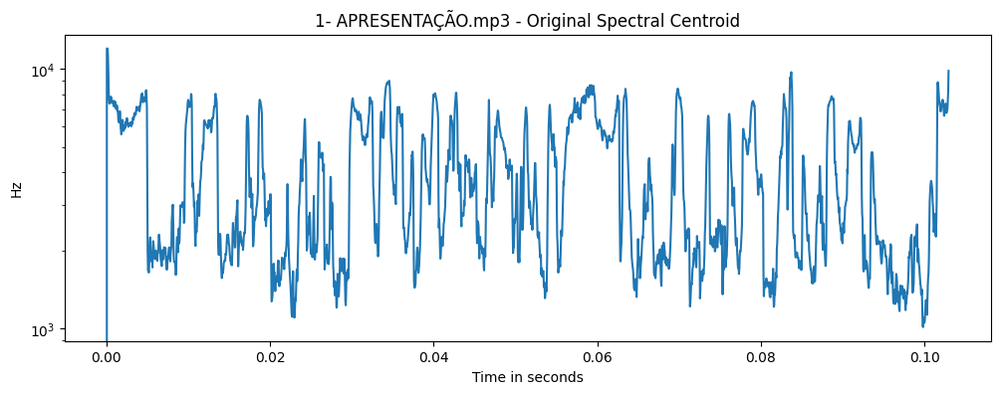

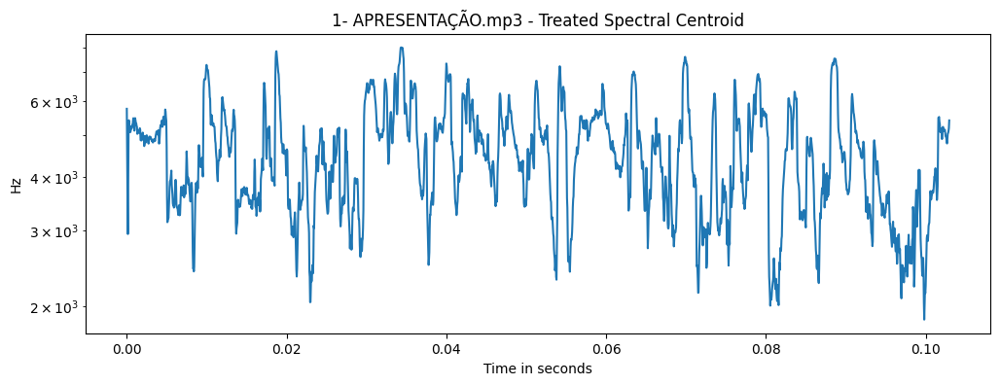

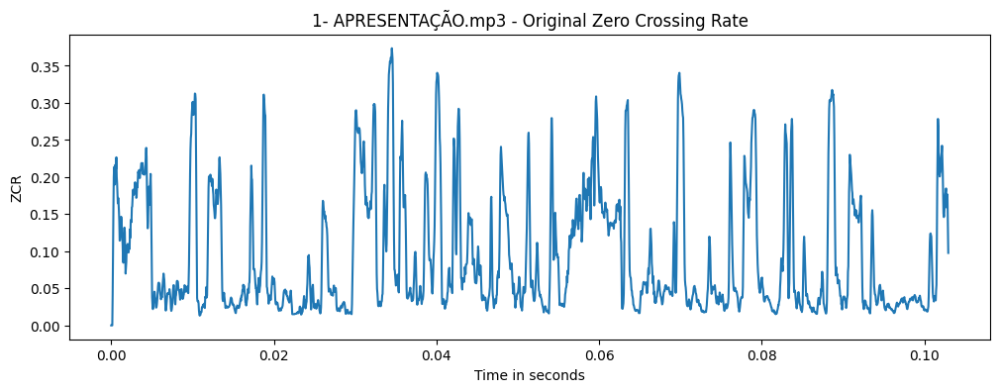

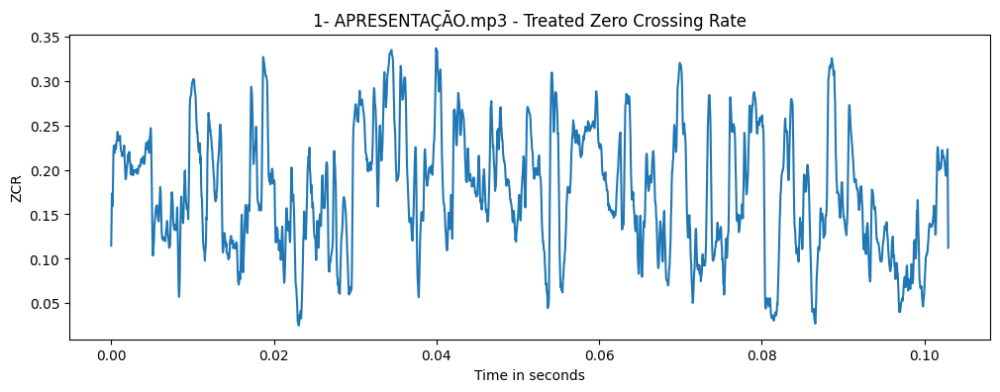

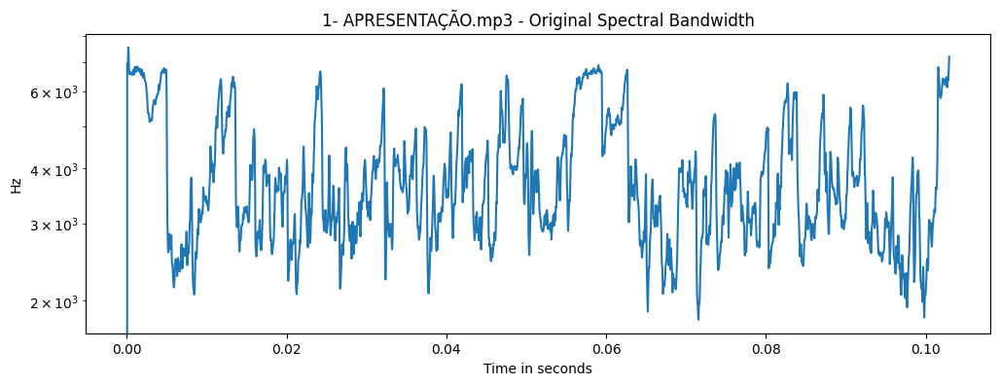

...

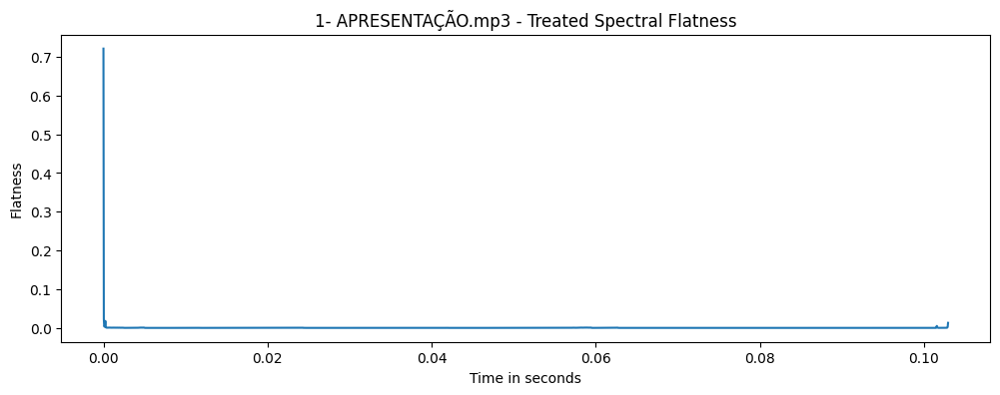

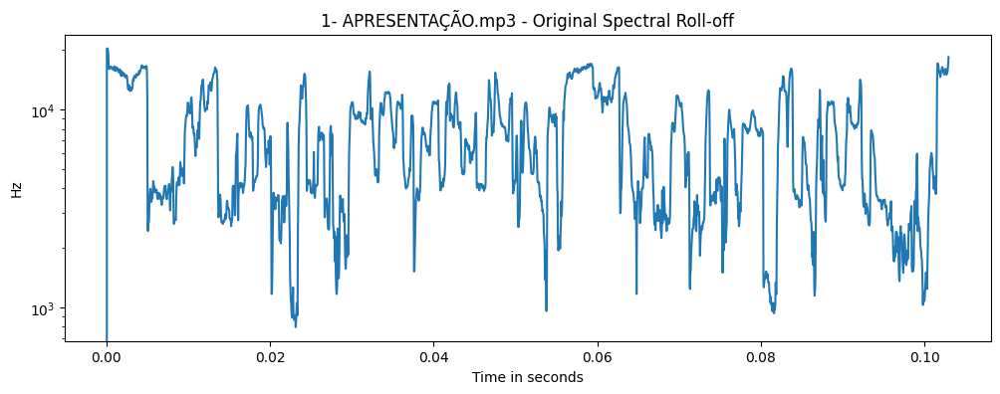

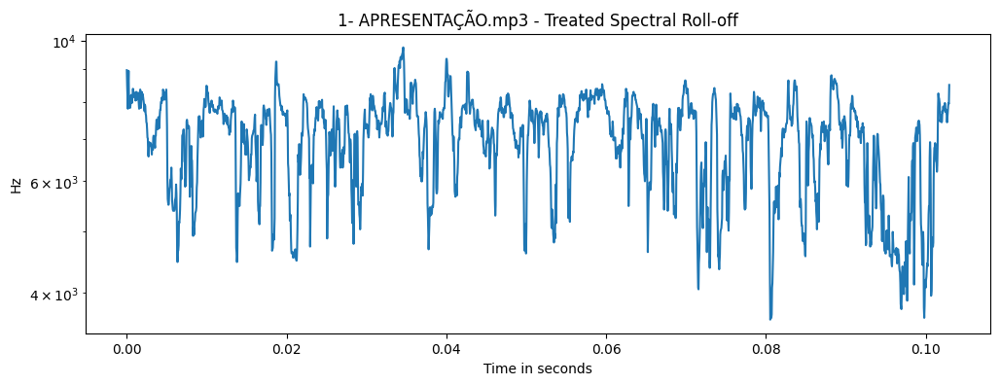

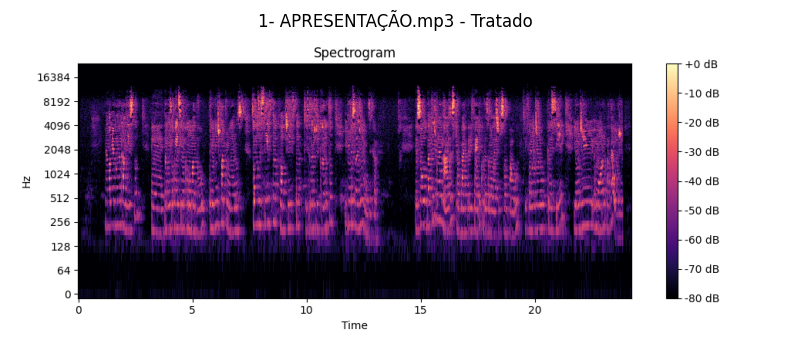

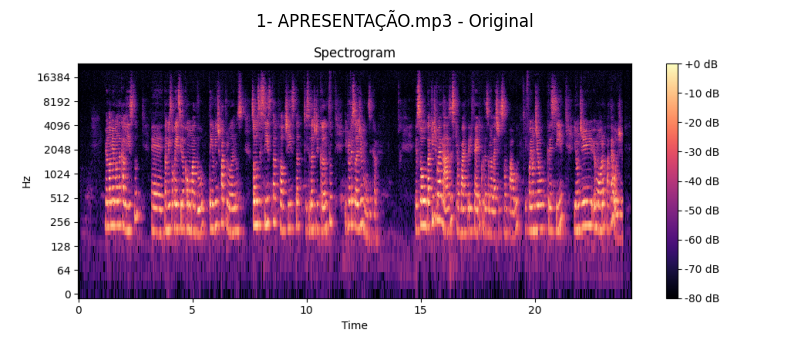

Analisando: 3 - SONHO E DEDICAÇÃO.mp3


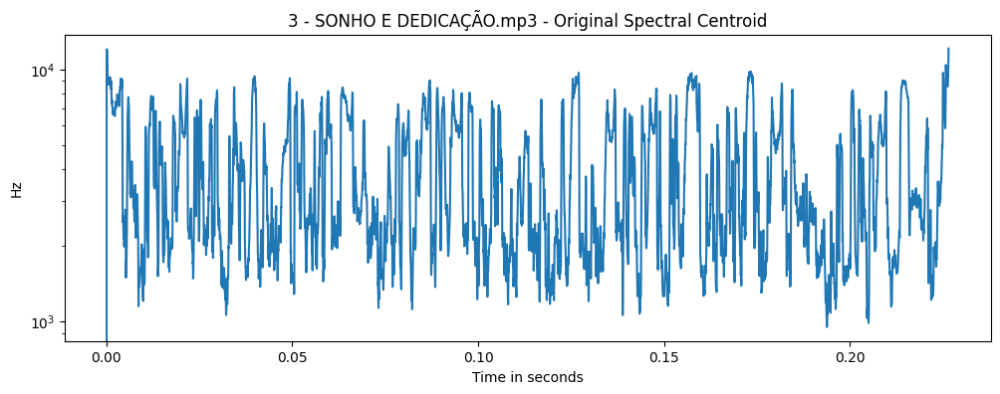

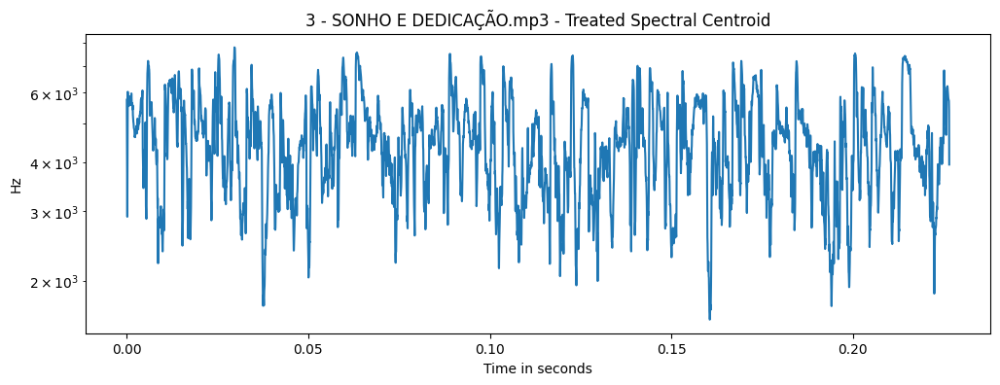

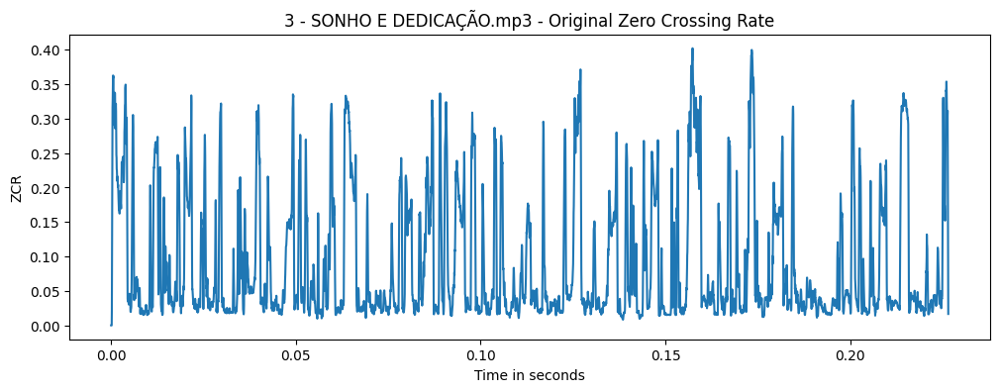

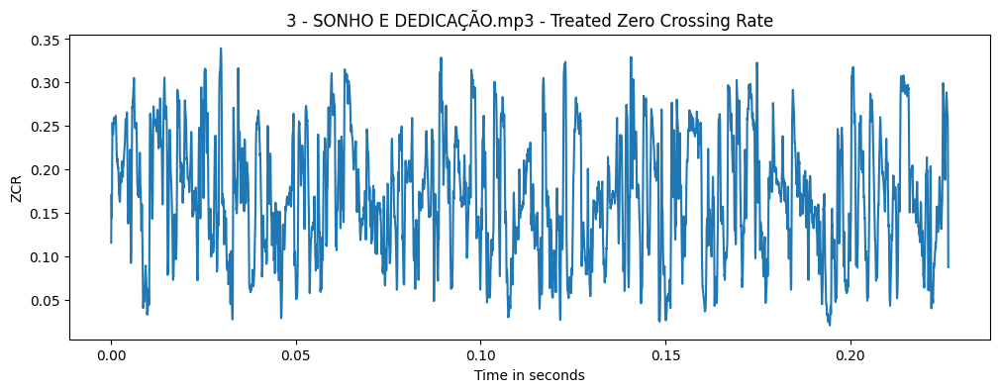

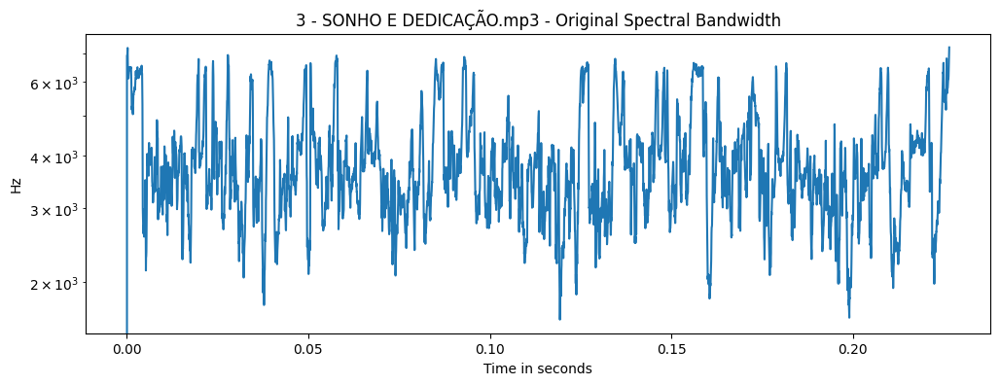

...

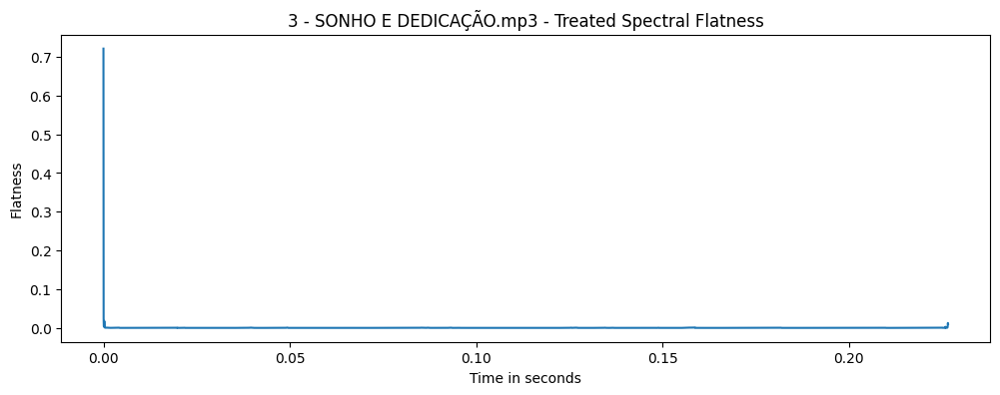

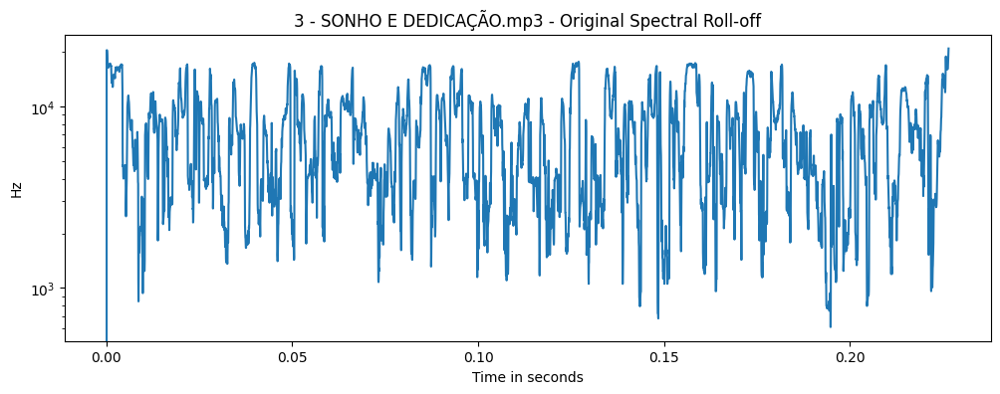

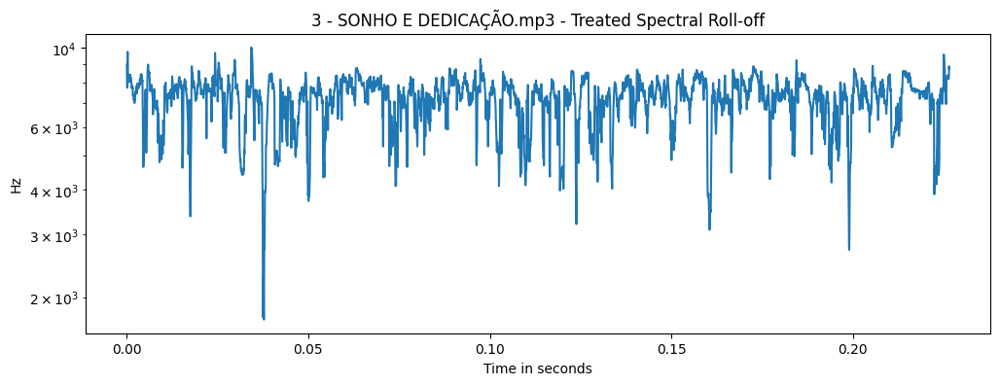

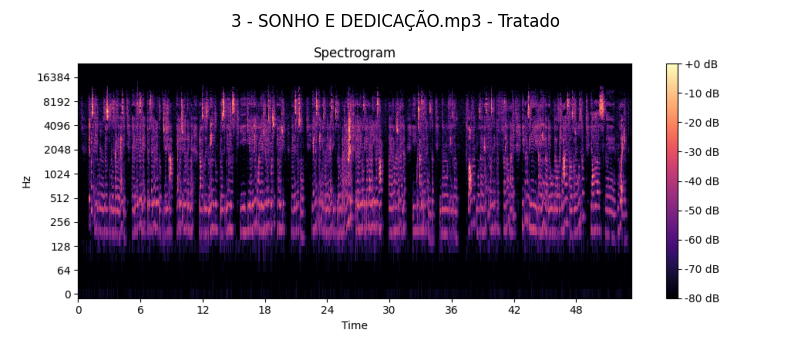

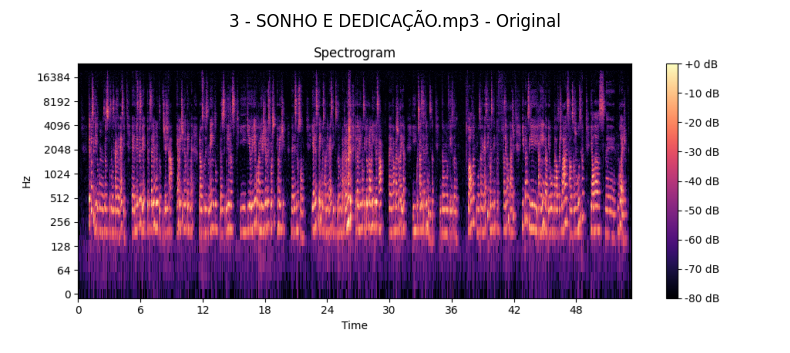

Analisando: 4 - DEDICAÇÃO -RESULTADO E CONSEQUÊNCIA.mp3


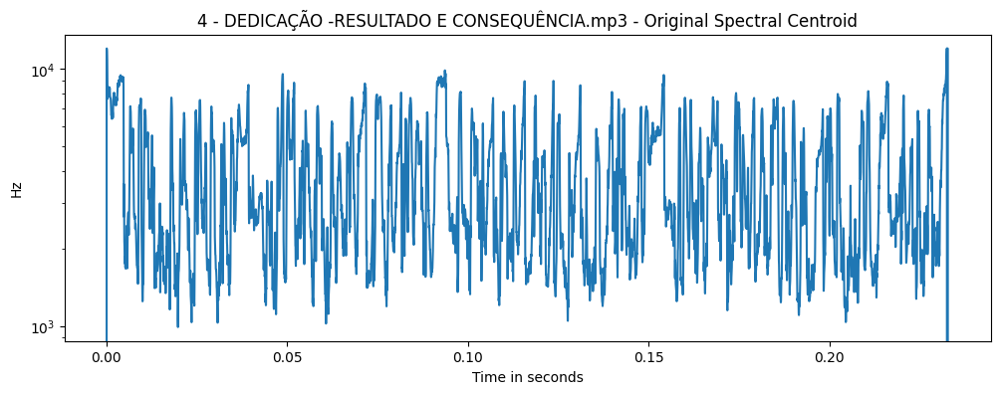

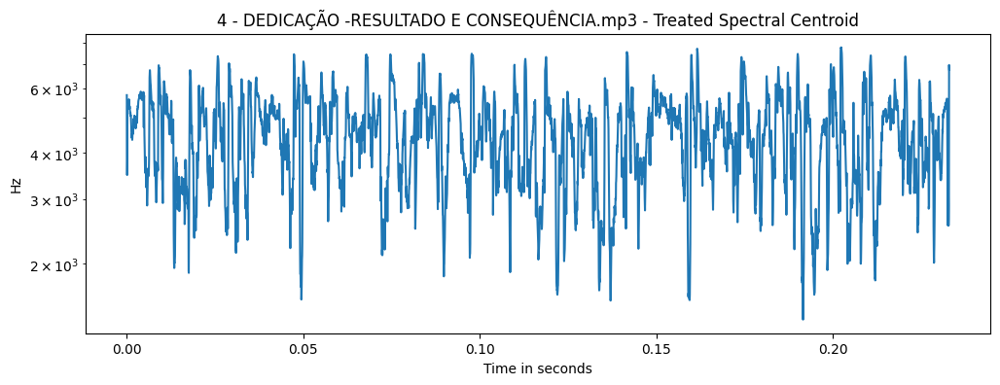

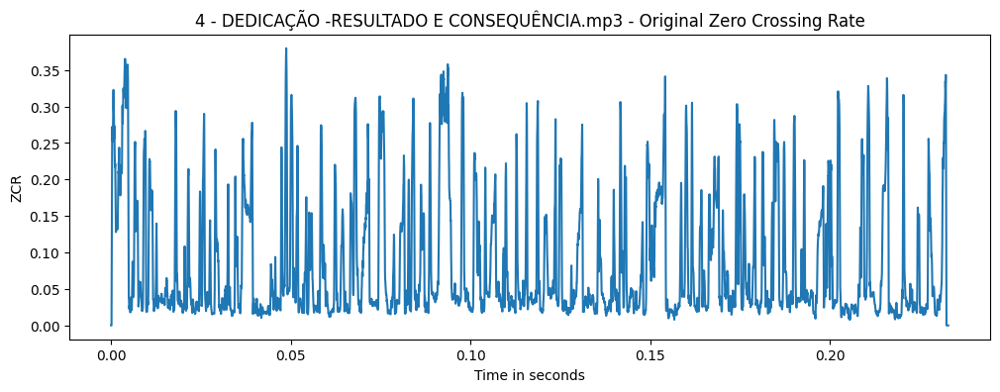

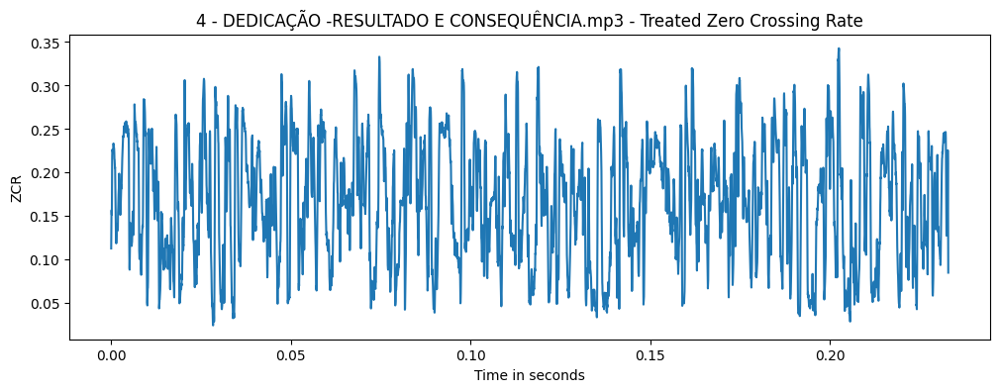

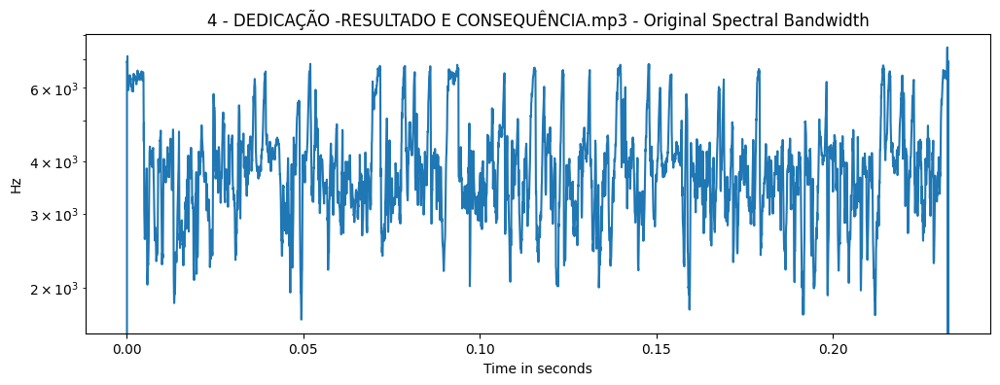

...

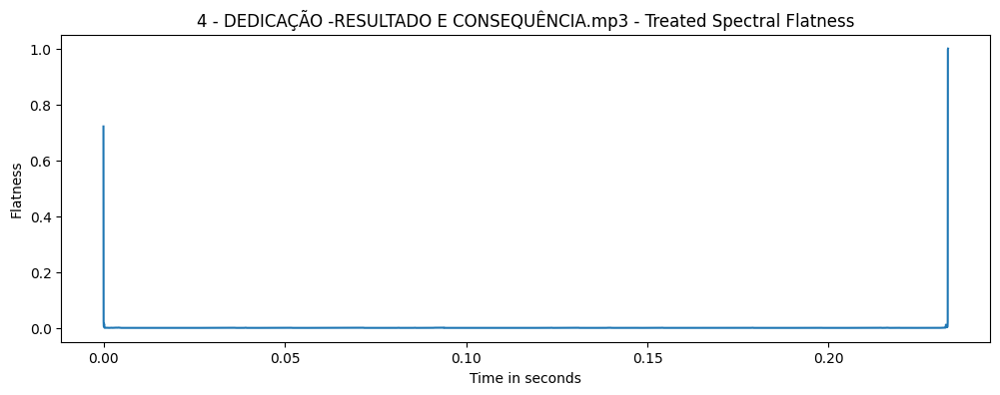

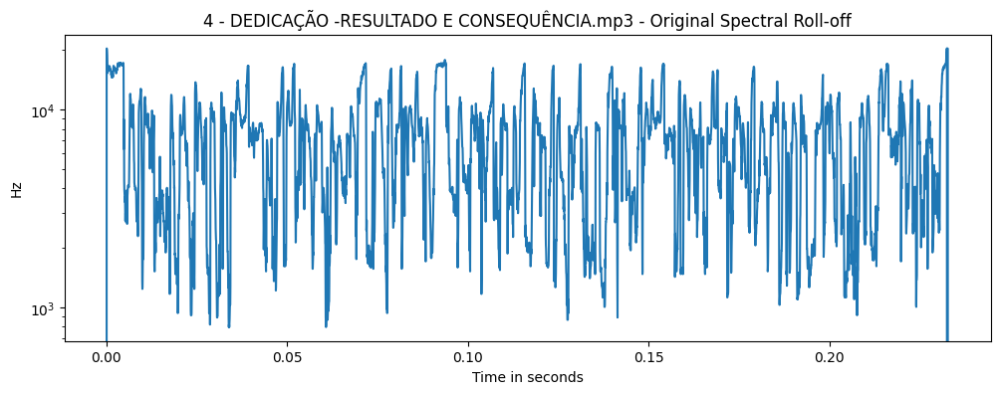

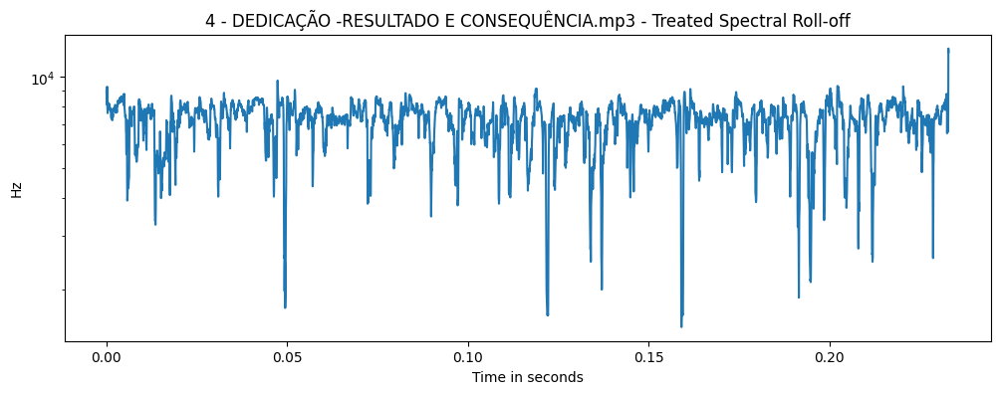

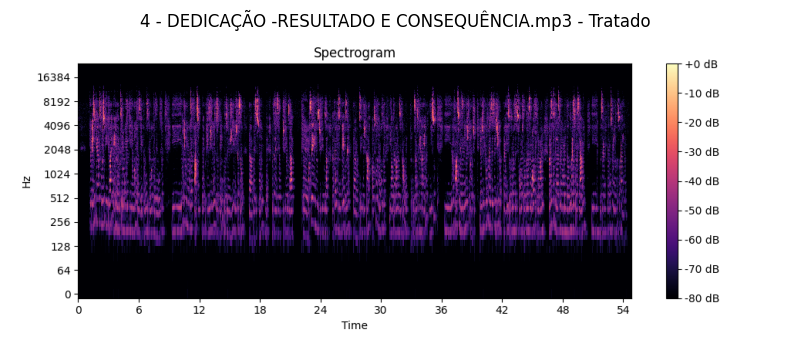

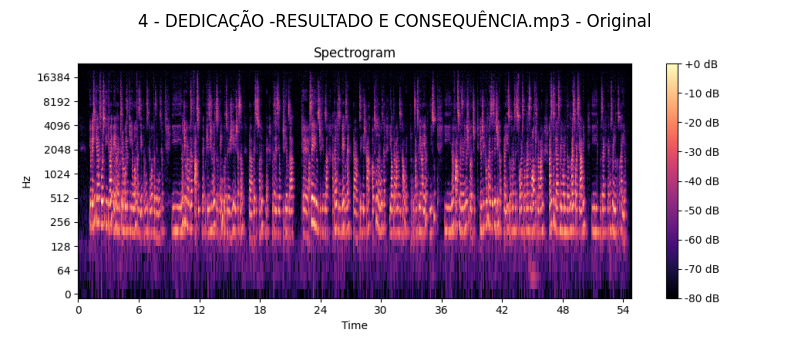

Analisando: 6-FUTURO.mp3


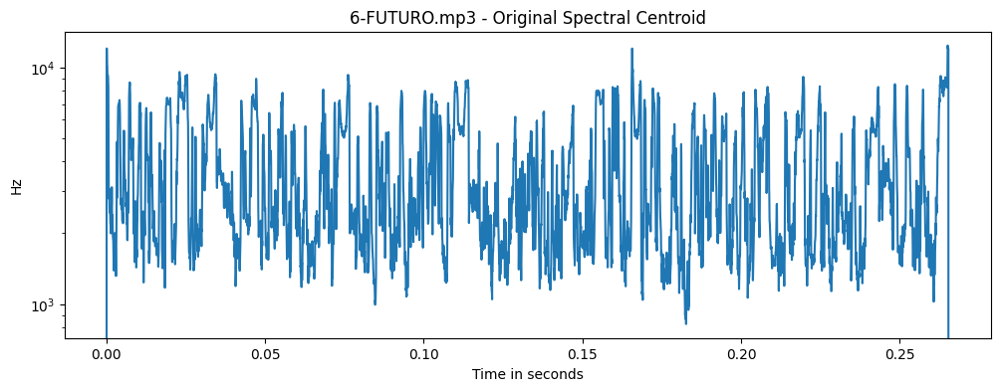

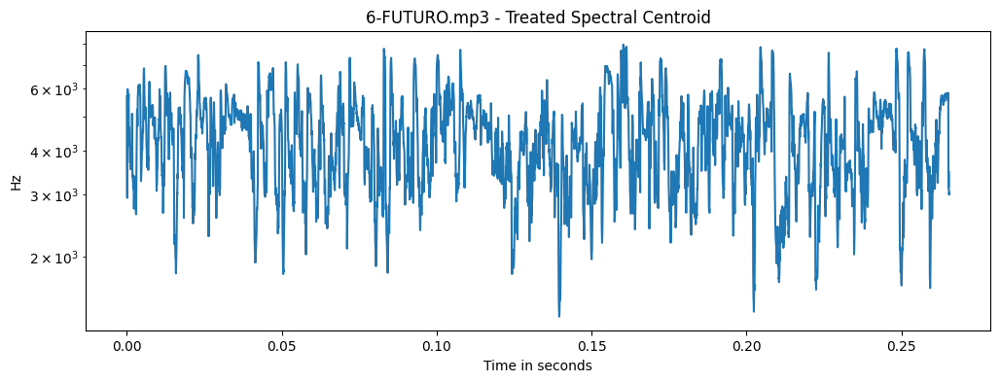

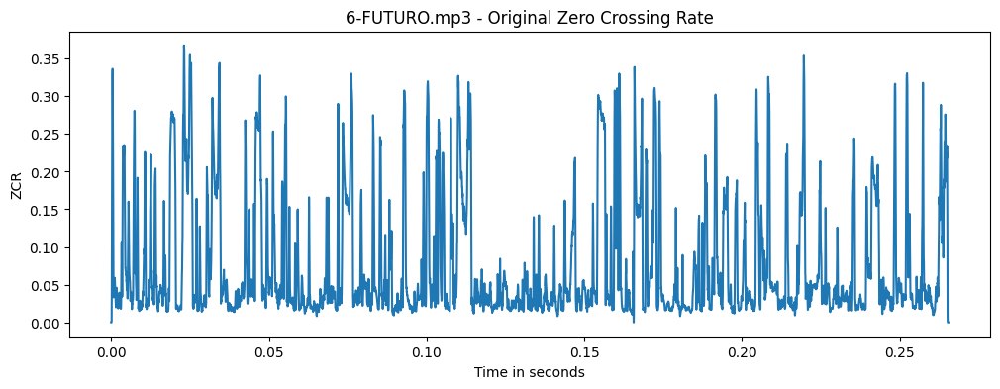

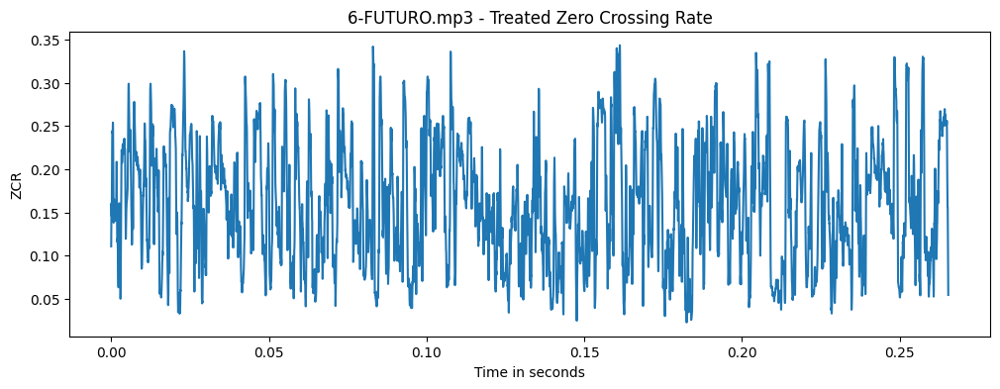

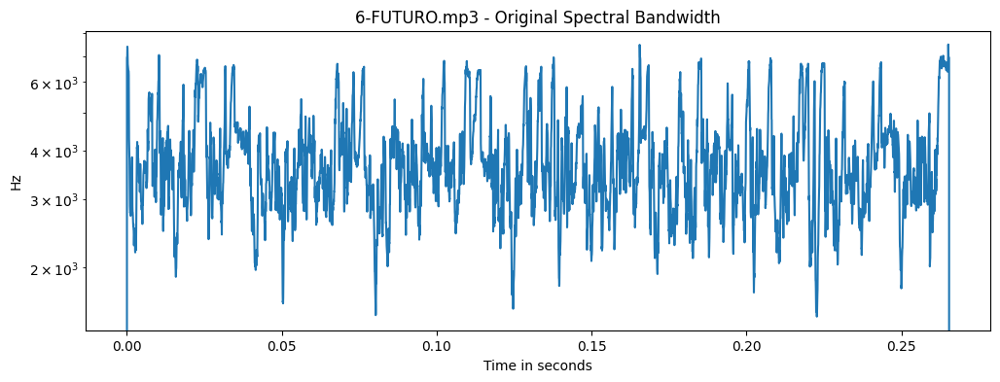

...

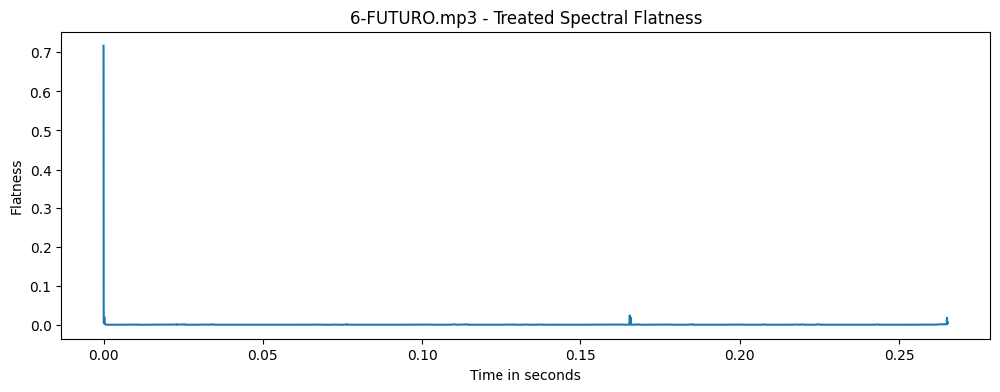

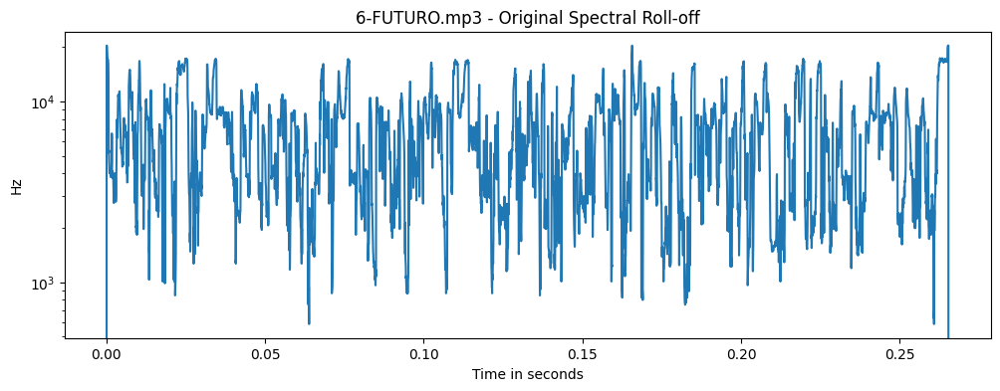

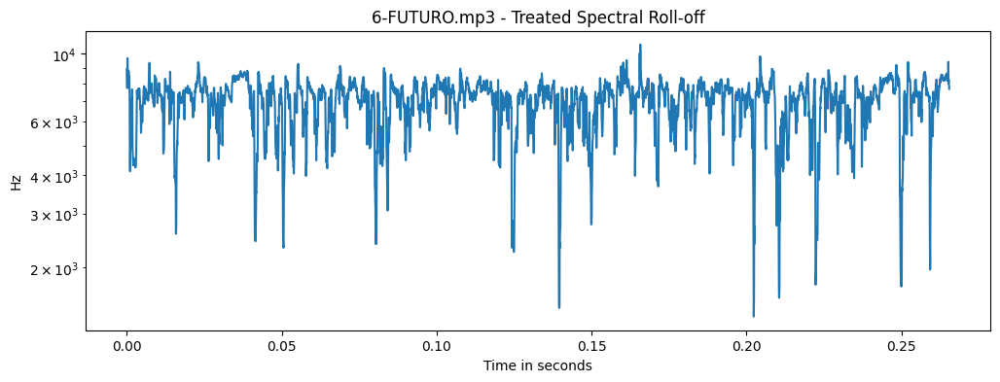

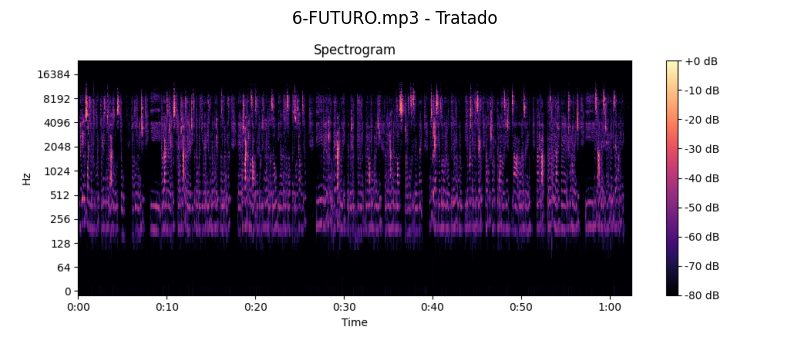

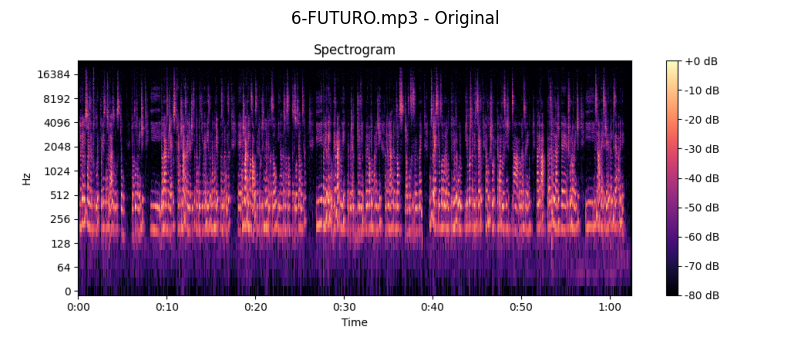

Analisando: 5 - EVOLUÇÃO.mp3


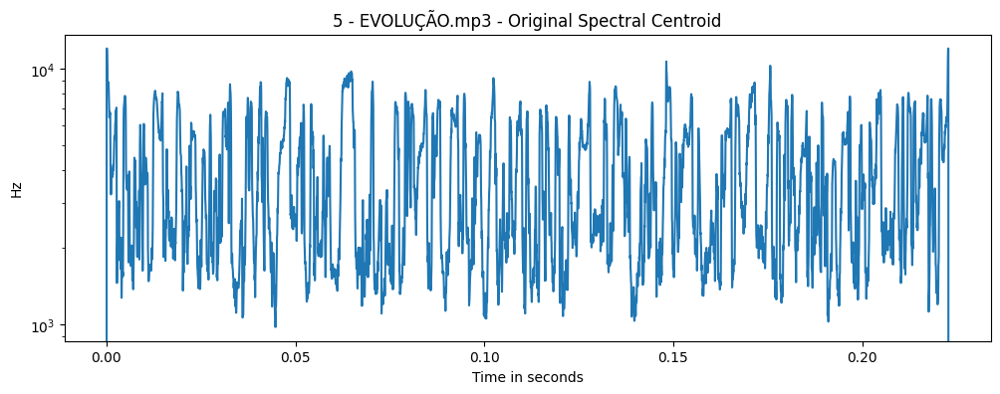

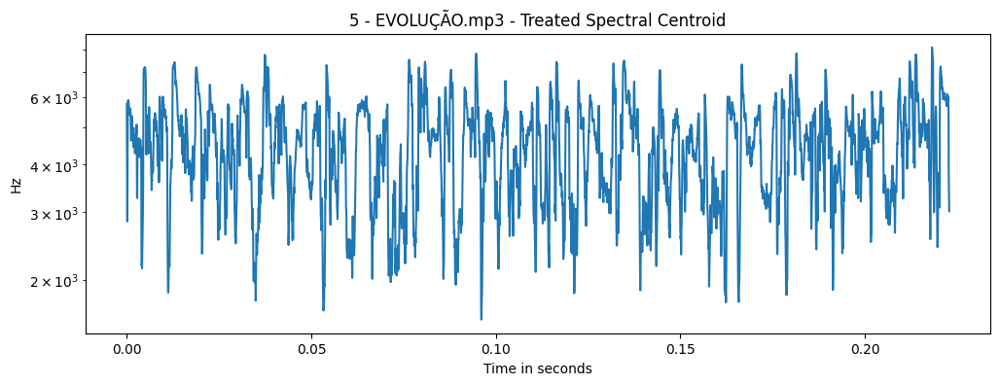

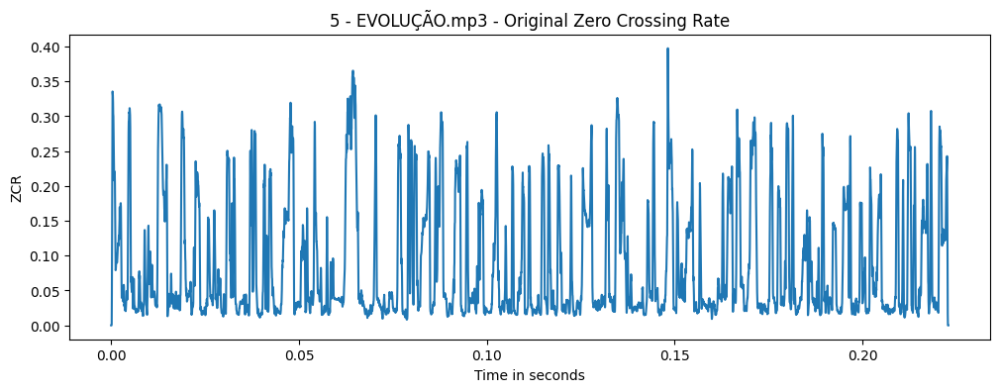

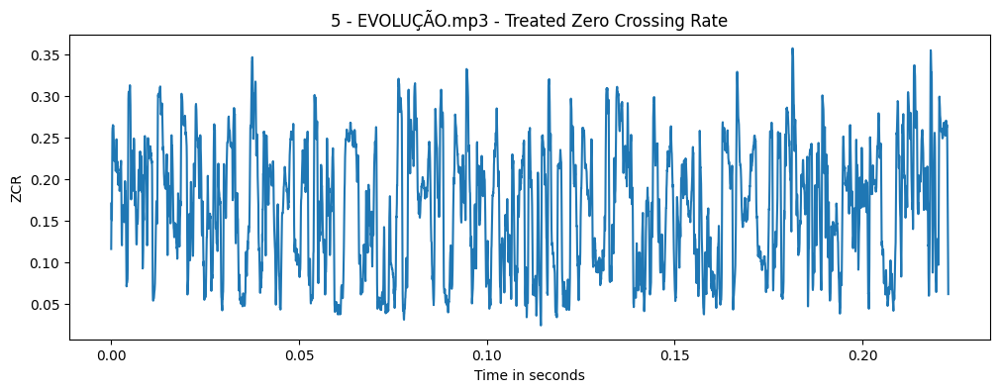

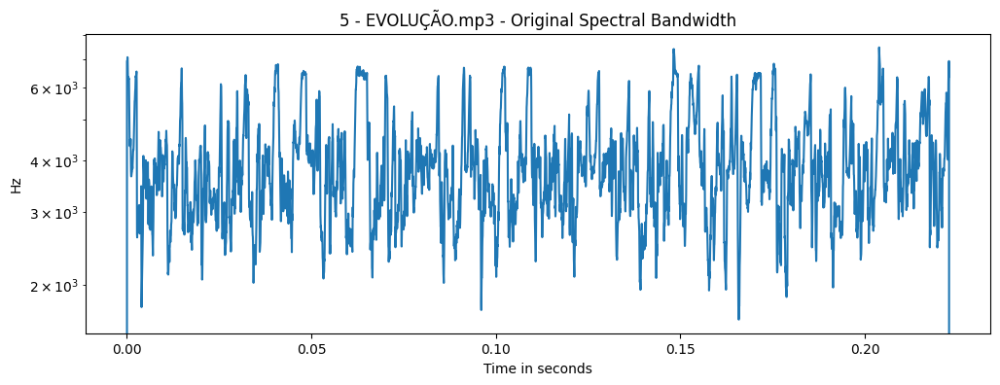

...

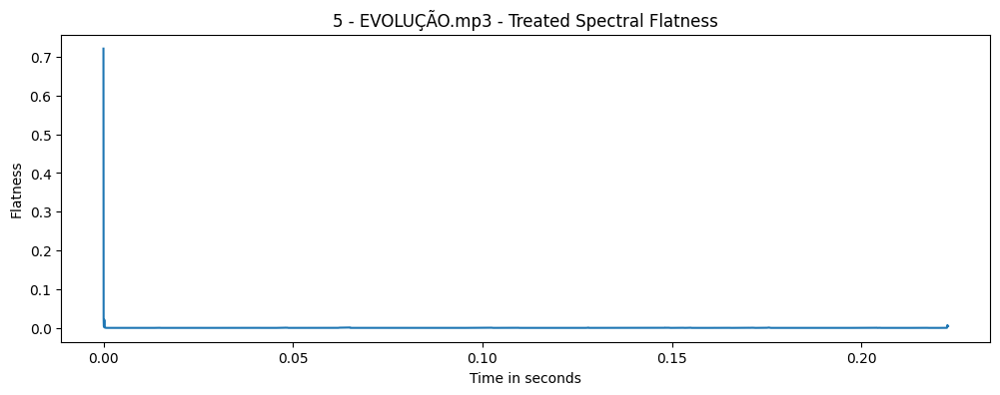

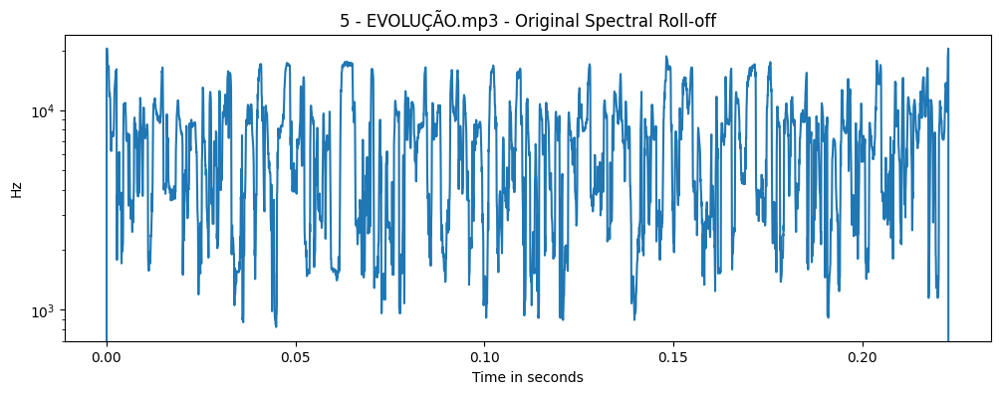

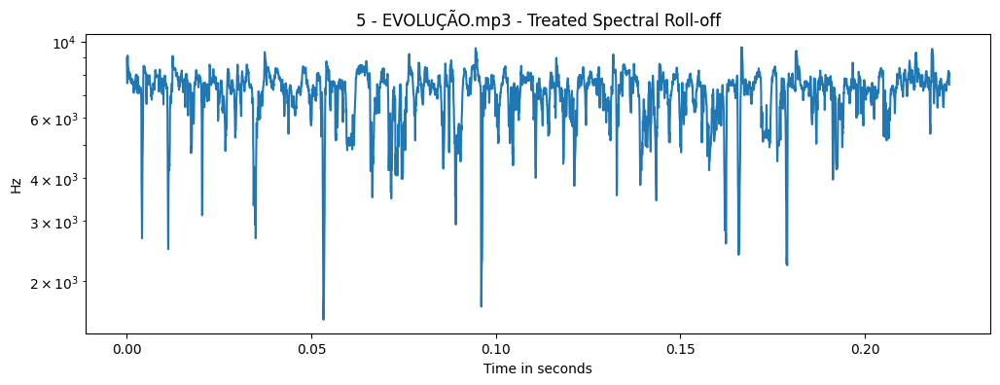

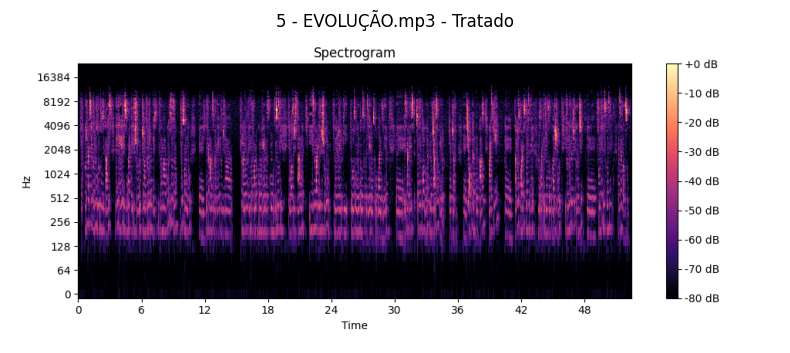

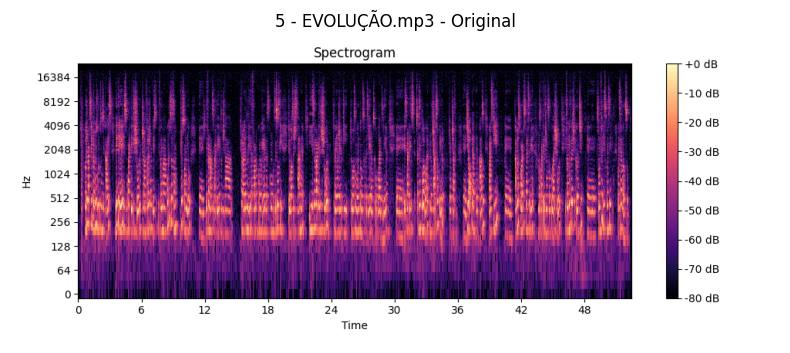

Analisando: 2- INÍCIO MUSICAL.mp3


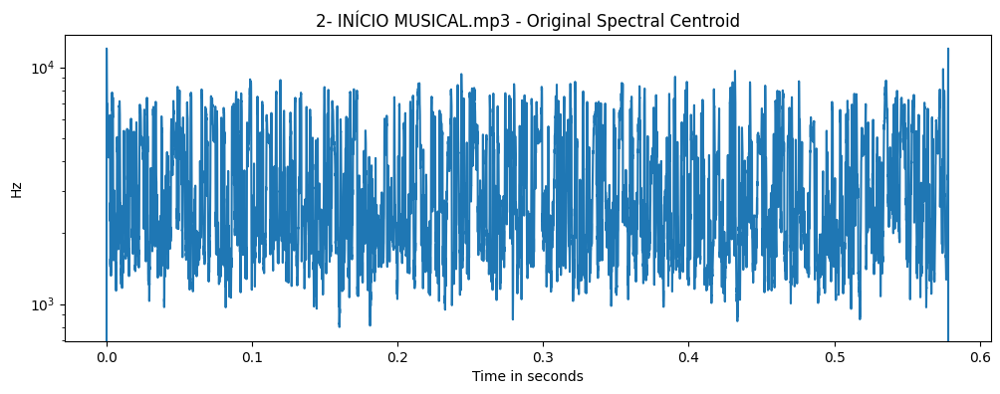

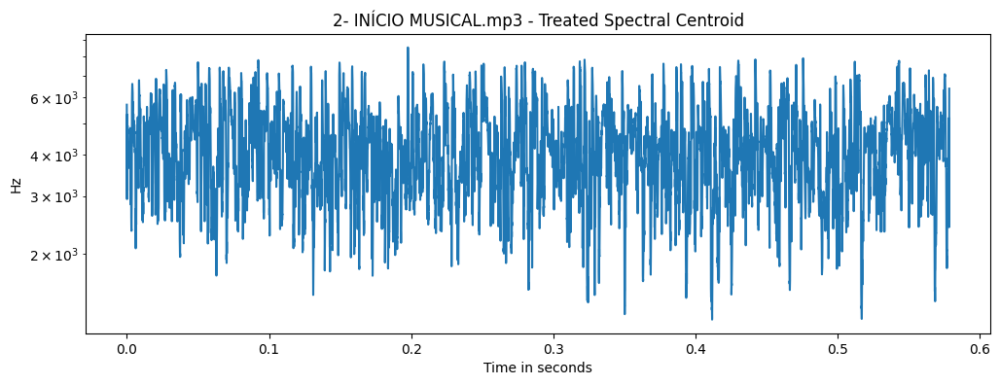

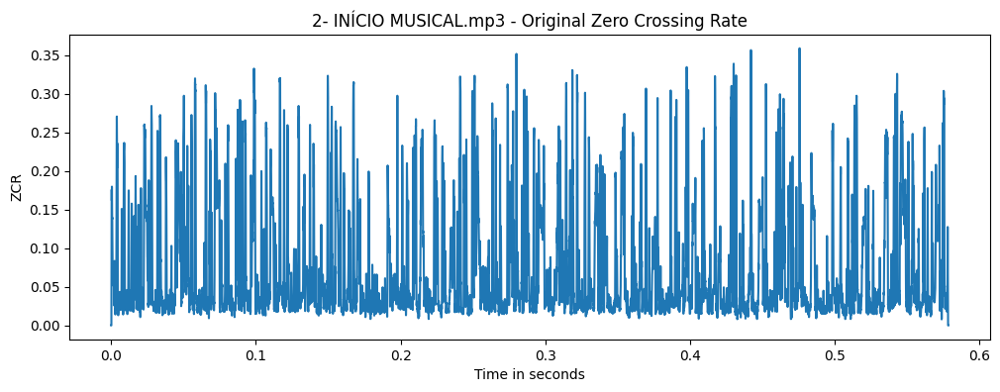

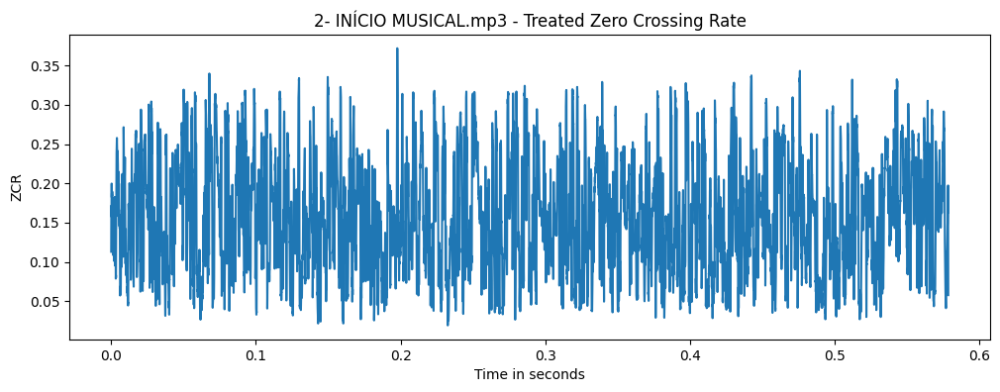

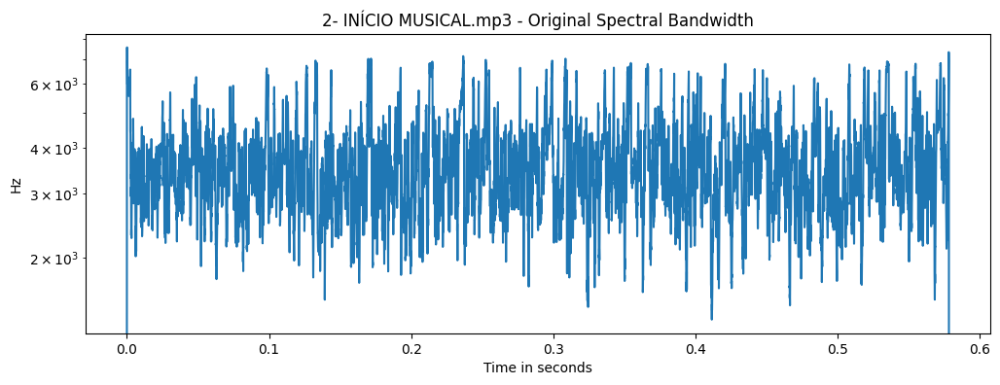

...

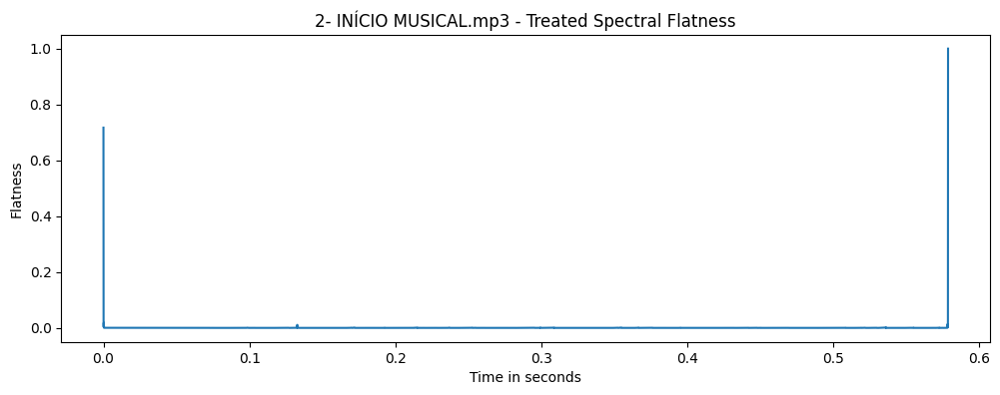

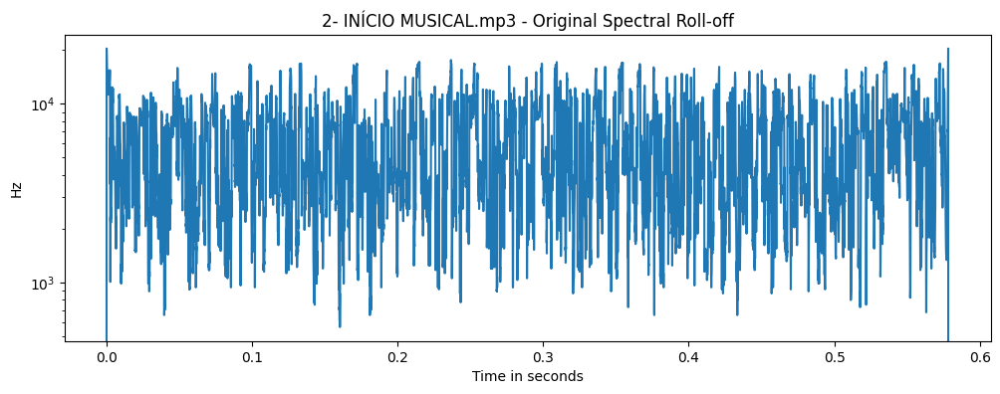

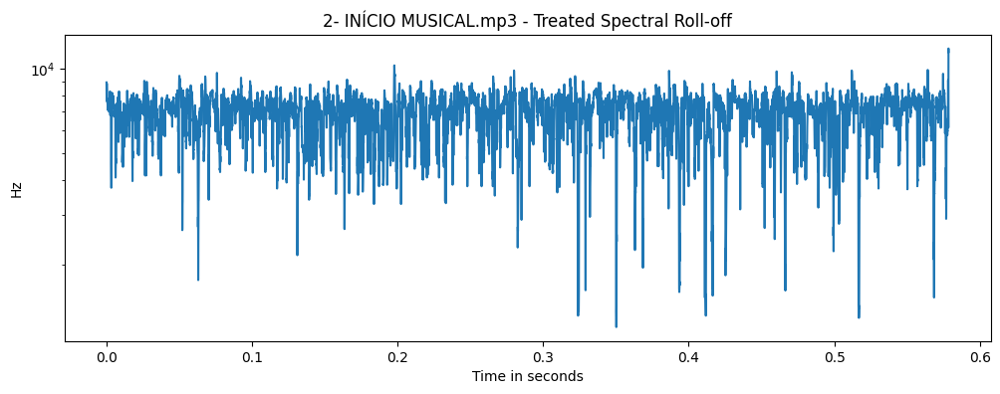

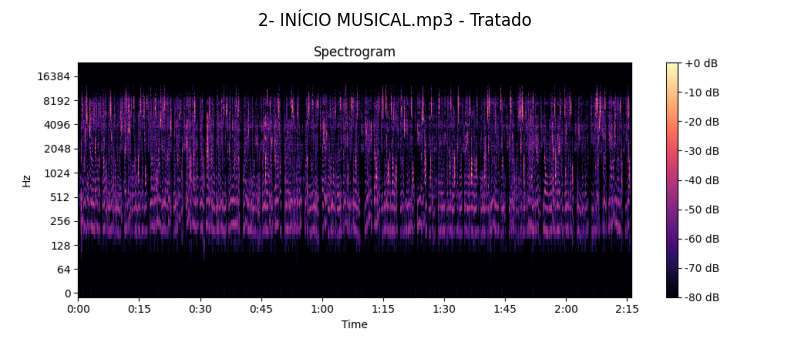

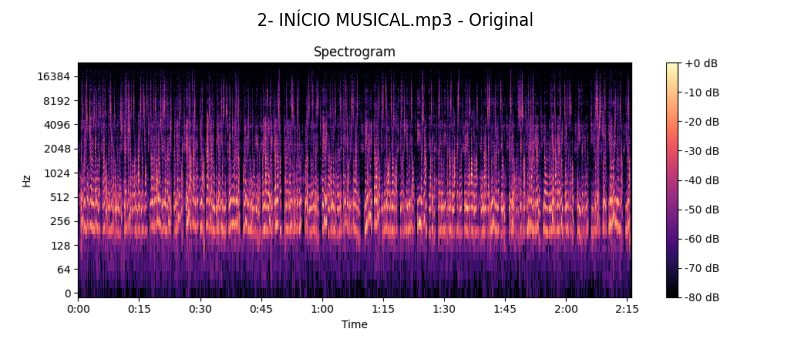


**Legenda das Métricas:**

- **RMS Desvio**: É uma medida de energia do sinal. Representa a quantidade de energia no áudio.
- **Zero Crossing Rate**: Indica o número de vezes que o sinal cruza o eixo zero. É usado para detectar a presença de ruído ou sons agudos.
- **Spectral Centroid**: Indica onde o "centro de massa" do espectro está localizado. Está correlacionado com a percepção de brilho de um som.
- **Spectral Bandwidth**: Mede a largura do espectro. Representa a extensão das frequências presentes no sinal.
- **Spectral Flatness**: Mede quão plano é o espectro. Um valor alto indica que o som é mais ruidoso, enquanto um valor baixo indica um som tonal.
- **Spectral Roll-off**: Indica a frequência abaixo da qual se encontra uma porcentagem específica da energia total do espectro. Geralmente usado para diferenciar ruído de sinais tonais.

Essas métricas ajudam a analisar as características do áudio, permitindo identificar a presença de ruídos, avaliar a qualidade do som e entender 

In [35]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Funções auxiliares
def read_metrics_file(filepath):
    metrics = {}
    with open(filepath, 'r') as file:
        for line in file:
            try:
                name, value = line.split(':', 1)
                value = value.strip()
                if value.startswith('[') and value.endswith(']'):
                    value = np.array(eval(value))
                else:
                    value = float(value)
                metrics[name.strip()] = value
            except ValueError:
                print(f"Warning: Could not parse line '{line.strip()}' in {filepath}")
    return metrics

def plot_waveform(y, sr, title):
    plt.figure(figsize=(12, 4))
    plt.plot(np.arange(len(y)) / sr, y)
    plt.title(title)
    plt.xlabel('Time in seconds')
    plt.ylabel('Amplitude')
    plt.show()

def plot_spectral_centroid(centroid, sr, title):
    plt.figure(figsize=(12, 4))
    plt.semilogy(np.arange(len(centroid)) / sr, centroid, label='Spectral Centroid')
    plt.ylabel('Hz')
    plt.xlabel('Time in seconds')
    plt.title(title)
    plt.show()

def plot_zero_crossing_rate(zcr, sr, title):
    plt.figure(figsize=(12, 4))
    plt.plot(np.arange(len(zcr)) / sr, zcr, label='Zero Crossing Rate')
    plt.ylabel('ZCR')
    plt.xlabel('Time in seconds')
    plt.title(title)
    plt.show()

def plot_spectral_bandwidth(bandwidth, sr, title):
    plt.figure(figsize=(12, 4))
    plt.semilogy(np.arange(len(bandwidth)) / sr, bandwidth, label='Spectral Bandwidth')
    plt.ylabel('Hz')
    plt.xlabel('Time in seconds')
    plt.title(title)
    plt.show()

def plot_spectral_flatness(flatness, sr, title):
    plt.figure(figsize=(12, 4))
    plt.plot(np.arange(len(flatness)) / sr, flatness, label='Spectral Flatness')
    plt.ylabel('Flatness')
    plt.xlabel('Time in seconds')
    plt.title(title)
    plt.show()

def plot_spectral_rolloff(rolloff, sr, title):
    plt.figure(figsize=(12, 4))
    plt.semilogy(np.arange(len(rolloff)) / sr, rolloff, label='Spectral Roll-off')
    plt.ylabel('Hz')
    plt.xlabel('Time in seconds')
    plt.title(title)
    plt.show()

def plot_spectrogram(filepath, title):
    img = plt.imread(filepath)
    plt.figure(figsize=(10, 4))
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')
    plt.show()

# Configuração das pastas de análise
treated_folder = '../audio/treated'
output_folder = '../audio/staging'

# Listar todos os arquivos de áudio na pasta treated
audio_files = [f for f in os.listdir(treated_folder) if f.endswith('.mp3')]

# Analisar e visualizar métricas e espectrogramas para cada arquivo de áudio
for audio_file in audio_files:
    print(f"Analisando: {audio_file}")
    base_filename = os.path.splitext(audio_file)[0]
    
    # Caminhos dos arquivos de métricas e espectrograma
    treated_metrics_file = os.path.join(treated_folder, 'analysis', f'{base_filename}_treated_metrics.txt')
    treated_spectrogram_path = os.path.join(treated_folder, 'analysis', f'{base_filename}_treated_spectrogram.png')
    original_metrics_file = os.path.join(output_folder, 'analysis', f'{base_filename}_original_metrics.txt')
    original_spectrogram_path = os.path.join(output_folder, 'analysis', f'{base_filename}_original_spectrogram.png')
    
    original_metrics = {}
    treated_metrics = {}
    
    # Carregar e plotar métricas tratadas e originais
    if os.path.exists(treated_metrics_file):
        treated_metrics = read_metrics_file(treated_metrics_file)
    else:
        print(f"Métricas não encontradas para o arquivo tratado: {treated_metrics_file}")
    
    if os.path.exists(original_metrics_file):
        original_metrics = read_metrics_file(original_metrics_file)
    else:
        print(f"Métricas não encontradas para o arquivo original: {original_metrics_file}")

    if original_metrics and treated_metrics:
        # Plotando as métricas específicas para cada arquivo
        if 'Spectral Centroid' in original_metrics and 'Spectral Centroid' in treated_metrics:
            plot_spectral_centroid(original_metrics['Spectral Centroid'], 22050, f'{audio_file} - Original Spectral Centroid')
            plot_spectral_centroid(treated_metrics['Spectral Centroid'], 22050, f'{audio_file} - Treated Spectral Centroid')
        
        if 'Zero Crossing Rate' in original_metrics and 'Zero Crossing Rate' in treated_metrics:
            plot_zero_crossing_rate(original_metrics['Zero Crossing Rate'], 22050, f'{audio_file} - Original Zero Crossing Rate')
            plot_zero_crossing_rate(treated_metrics['Zero Crossing Rate'], 22050, f'{audio_file} - Treated Zero Crossing Rate')
        
        if 'Spectral Bandwidth' in original_metrics and 'Spectral Bandwidth' in treated_metrics:
            plot_spectral_bandwidth(original_metrics['Spectral Bandwidth'], 22050, f'{audio_file} - Original Spectral Bandwidth')
            plot_spectral_bandwidth(treated_metrics['Spectral Bandwidth'], 22050, f'{audio_file} - Treated Spectral Bandwidth')
        
        if 'Spectral Flatness' in original_metrics and 'Spectral Flatness' in treated_metrics:
            plot_spectral_flatness(original_metrics['Spectral Flatness'], 22050, f'{audio_file} - Original Spectral Flatness')
            plot_spectral_flatness(treated_metrics['Spectral Flatness'], 22050, f'{audio_file} - Treated Spectral Flatness')
        
        if 'Spectral Roll-off' in original_metrics and 'Spectral Roll-off' in treated_metrics:
            plot_spectral_rolloff(original_metrics['Spectral Roll-off'], 22050, f'{audio_file} - Original Spectral Roll-off')
            plot_spectral_rolloff(treated_metrics['Spectral Roll-off'], 22050, f'{audio_file} - Treated Spectral Roll-off')
    
    # Carregar e plotar espectrogramas tratados e originais
    if os.path.exists(treated_spectrogram_path):
        plot_spectrogram(treated_spectrogram_path, f'{audio_file} - Tratado')
    else:
        print(f"Espectrograma não encontrado para o arquivo tratado: {treated_spectrogram_path}")
    
    if os.path.exists(original_spectrogram_path):
        plot_spectrogram(original_spectrogram_path, f'{audio_file} - Original')
    else:
        print(f"Espectrograma não encontrado para o arquivo original: {original_spectrogram_path}")

# Legenda das métricas
metricas_legenda = """
**Legenda das Métricas:**

- **RMS Desvio**: É uma medida de energia do sinal. Representa a quantidade de energia no áudio.
- **Zero Crossing Rate**: Indica o número de vezes que o sinal cruza o eixo zero. É usado para detectar a presença de ruído ou sons agudos.
- **Spectral Centroid**: Indica onde o "centro de massa" do espectro está localizado. Está correlacionado com a percepção de brilho de um som.
- **Spectral Bandwidth**: Mede a largura do espectro. Representa a extensão das frequências presentes no sinal.
- **Spectral Flatness**: Mede quão plano é o espectro. Um valor alto indica que o som é mais ruidoso, enquanto um valor baixo indica um som tonal.
- **Spectral Roll-off**: Indica a frequência abaixo da qual se encontra uma porcentagem específica da energia total do espectro. Geralmente usado para diferenciar ruído de sinais tonais.

Essas métricas ajudam a analisar as características do áudio, permitindo identificar a presença de ruídos, avaliar a qualidade do som e entender melhor o conteúdo do sinal.
"""

print(metricas_legenda)
